# Vector 2: Geometries, Spatial Joins and Visualization

UW Geospatial Data Analysis  
CEE498/CEWA599  
David Shean  

## Objectives
* Continue to explore GeoPandas functionality
* Explore basic geometry operations (e.g., buffer, intersect, union)
* Explore spatial filtering and spatial joins
* Explore new visualization approaches (e.g., hexbin, interactive maps)

Let's use the ICESat GLAS dataset one final time and cover some additional important vector concepts.

## Background

https://automating-gis-processes.github.io/site/notebooks/L1/geometric-objects.html

Take a look at the first few sections of the shapely manual: https://shapely.readthedocs.io/en/stable/manual.html

Many of these are implemented in GeoPandas, and they will operate over GeoDataFrame and GeoSeries objects:
https://geopandas.org/reference.html

These are common functions, and good to have in your toolkit for additional spatial analysis
If you've taken a GIS class, you've definitely encountered these, probably through some kind of vector toolkit

# Interactive Discussion
### GeoDataFrame vs. GeoSeries
* https://geopandas.org/data_structures.html

### Geometry objects
* POINT, LINE, POLYGON
* Polygon vs. MultiPolygon
* https://automating-gis-processes.github.io/site/notebooks/L1/geometric-objects.html

### GEOS geometry operations, as exposed by `shapely`
* GEOS https://trac.osgeo.org/geos/
* https://geopandas.org/geometric_manipulations.html
* Intersection
* Union
* Buffer

### Spatial joins with GeoPandas
* https://gisgeography.com/spatial-join/
* https://pandas.pydata.org/pandas-docs/stable/user_guide/merging.html

### Visualization: Chloropleth and Heatmap
* https://geopandas.org/mapping.html

### Interactive plotting
* ipyleaflet, folium
* Basemap tiles with contextily

# Interactive Demo

In [1]:
## Polygon creation
## Basic geometric operations on GeoDataFrame and Geometry objects

# Lab Exercises

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import fiona
plt.rcParams['figure.figsize'] = [10, 8]

In [3]:
#%matplotlib widget
#%matplotlib inline

## Opening up your Vector 1 lab notebook for reference
* Can also refer to the [solutions notebook](https://github.com/UW-GDA/gda_w2020_solutions/blob/master/04_Geopandas_CRS_Projections_Geometries/04_Geopandas_CRS_Projections_Geometries_solutions.ipynb)

## Read in the gpkg of reprojected GLAS points
* Ideally, use the file with equal-area projection
* Note, you can right-click on a file in the Jupyterlab file browser, and select "Copy Path", then paste, but make sure you get the correct relative path to the new notebook (`../`)
* If you have issues with your file, you can recreate:
    * Read the original GLAS csv
    * Load into GeoDataFrame, define CRS (`'EPSG:4326'`)
    * Reproject with following PROJ string: `'+proj=aea +lat_1=37.31 +lat_2=46.69 +lat_0=42.00 +lon_0=-114.27'`

In [6]:
aea_fn = '../04_Vector1_Geopandas_CRS_Proj/conus_glas_aea.gpkg'
glas_gdf_aea = gpd.read_file(aea_fn)

## Create a variable to store the `crs` of your GeoDataFrame
* Quickly print this out to verify everything looks good

In [5]:
#aea_crs = '+proj=aea +lat_1=37.31 +lat_2=46.69 +lat_0=42.00 +lon_0=-114.27'
aea_crs = glas_gdf_aea.crs
aea_crs

{'proj': 'aea',
 'lat_0': 42,
 'lon_0': -114.27,
 'lat_1': 37.31,
 'lat_2': 46.69,
 'x_0': 0,
 'y_0': 0,
 'datum': 'WGS84',
 'units': 'm',
 'no_defs': True}

## Read in the state polygons

In [6]:
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

## Limit to Lower48

In [7]:
idx = states_gdf['NAME'].isin(['Alaska','Puerto Rico','Hawaii'])
states_gdf = states_gdf[~idx]

## Reproject the states to match the `crs` of your points

In [8]:
states_gdf_aea = states_gdf.to_crs(aea_crs)

/srv/conda/envs/notebook/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


## Create a quick plot to verify everything looks good
* Can re-use plotting code near the end of Lab04

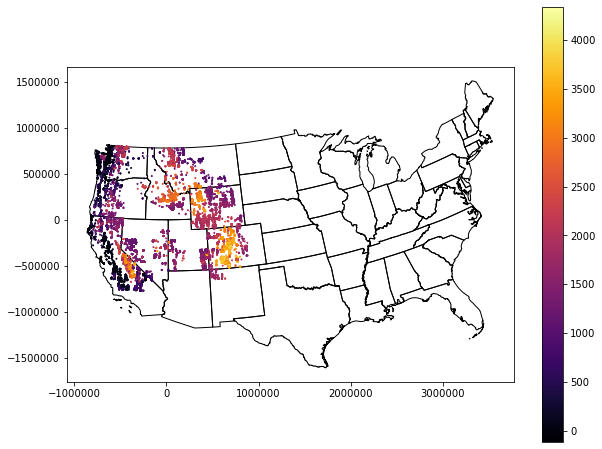

In [9]:
f, ax = plt.subplots()
states_gdf_aea.plot(ax=ax, facecolor='none', edgecolor='k')
glas_gdf_aea.plot(ax=ax, column='glas_z', cmap='inferno', markersize=1, legend=True);

## Extract the MultiPolygon geometry object for Washington from your reprojected states GeoDataFrame
* Use the state 'NAME' value to isolate the approprate GeoDataFrame record for Washington
* Assign the `geometry` attribute for this record to a new variable called `wa_geom`
    * This is a little tricky
    * After a boolean filter to get the WA record, you will need to use something like `iloc[0]` to extract a GeoSeries, and then isolate the `geometry` attribute
        * `wa_geom = wa_gdf.iloc[0].geometry`
    * Use the python `type()` function to verify that your output type is `shapely.geometry.multipolygon.MultiPolygon`

In [10]:
# This is a new GeoDataFrame with one entry
wa_gdf = states_gdf_aea[states_gdf_aea['NAME'] == 'Washington']

In [11]:
# This is the Geometry object for that one entry
wa_geom = wa_gdf.iloc[0].geometry

In [12]:
type(wa_geom)

shapely.geometry.multipolygon.MultiPolygon

## Inspect the Washington geometry object

### What happens when you pass the geometry object to `print()`? (clear or hide the output, then summarize what happened)

### What happens when you execute a notebook cell containing only the geometry object variable name? Oooh.

In [ ]:
wa_geom

### What is the geometry type?

In [15]:
wa_geom.geom_type

'MultiPolygon'

## Find the geometric center of WA state
* See the `centroid` attribute
* You may have to `print()` this to see the coordinates

In [16]:
#GeoDataFrame
#c = wa_gdf.centroid.iloc[0]
#MultiPolygon Geometry
c = wa_geom.centroid
print(c)

POINT (-467390.3437280217 616075.562020384)


### How many individual polygons are contained in the WA geometry?  
* Hint: how would you get the number of elements in a standard Python tuple or list?  
* If more than one, why?

In [ ]:
len(wa_geom)

## Cracking open the geometry collection

### Compute the area of each individual polygon
* Remember, this MultiPolygon object is iterable, so maybe list comprehension here?
* Store the output areas in a new list or array

In [ ]:
poly_area = [x.area for x in wa_geom]
poly_area

### Isolate and render the polygons that have min and max area
* Remember the NumPy `argmax` function? Maybe useful here...

In [19]:
maxidx = np.argmax(poly_area)
minidx = np.argmin(poly_area)

In [ ]:
print(wa_geom[maxidx].area)
wa_geom[maxidx]

In [ ]:
print(wa_geom[minidx].area)
wa_geom[minidx]

### How many vertices are in the largest polygon?
* Let's start by looking at the `exterior` ring of the largest polygon geometry
    * This is actually a line, so if you ever need to convert a polygon geometry to a line geometry, now you know it's easy! 
    * You should see an outline of WA state
* Now let's access the coordinates for this line geometry with `coords[:]`
    * This will return a list of (x,y) tuples for each vertex
* You already know how to determine the number of items in a list!

In [ ]:
wa_geom[maxidx].exterior

In [ ]:
#Preview first 10 vertices
wa_geom[maxidx].exterior.coords[:][0:10]

In [ ]:
# Note -1 to remove repeated coord needed to close the polygon
len(wa_geom[maxidx].exterior.coords[:]) - 1

## How many vertices in the smallest polygon?

In [ ]:
len(wa_geom[minidx].exterior.coords[:]) - 1

### Take a look at the list of (x,y) coordinates in the smallest polygon
* What do you notice about the first and last coordinate?

In [ ]:
wa_geom[minidx].exterior.coords[:]

This is a closed polygon!  It starts and ends at the same point.  So technically, you have one less vertex than the total number of points in the polygon.

## Determine the perimeter of WA state in km
* This should be quick - just use an attribtue of the MultiPolygon geometry

In [ ]:
wa_geom.length/1E3

## Explore the `simplify()` method for your MultiPolygon
* This can be very useful if you have complex geometry objects that require a lot of memory
    * Perhaps a line from a GPS track, or a polygon extracted from a raster with a vertex at each pixel
    * You can simplify, preserve almost all of the original information, and remove many (sometimes most) of the redundant/unnecessary vertices
* https://shapely.readthedocs.io/en/latest/manual.html#object.simplify
* Need to provide a `tolerance` in units of meters
    * Try 100, 1000, 10000, 100000
    * How does this affect the perimeter measurement?

In [28]:
def smart_simplify(geom, tol):
    newgeom = geom.simplify(tol)
    newvertcount = sum(len(x.exterior.coords[:]) for x in newgeom)
    gpd.GeoSeries(newgeom).plot(figsize=(4,3))
    print(tol, '%0.1f' % (newgeom.length/1E3), newvertcount)

Tolerance Perimieter Num vertices
100 3512.1 1436
1000 3416.1 427
10000 3011.7 110
100000 2449.1 68


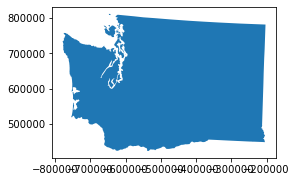

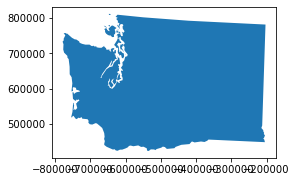

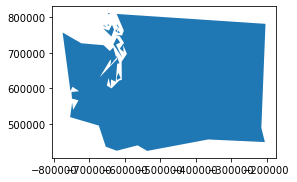

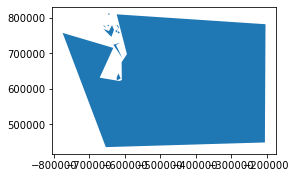

In [29]:
print("Tolerance", "Perimieter", "Num vertices")
for i in (100,1000,10000,100000):
    smart_simplify(wa_geom, i)

## Extra Credit: What percentage of the total WA state perimeter is from islands?

In [ ]:
(1.0 - (wa_geom[maxidx].length / wa_geom.length))*100

# Unite the West Coast!
* Let's create a single Multipolygon for West Coast states: Washington, Oregon and California
* Start by extracting those states to a new GeoDataFrame - can use the `isin()` function for Pandas, which is similar to built-in `in` operation in Python

In [31]:
idx = states_gdf_aea['NAME'].isin(['Washington','Oregon','California'])
westcoast_gdf = states_gdf_aea[idx]
westcoast_gdf

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
4,0400000US06,06,California,,155779.220,"MULTIPOLYGON (((-715643.093 -425702.978, -7156..."
37,0400000US41,41,Oregon,,95988.013,"POLYGON ((-594882.050 433066.202, -593746.435 ..."
47,0400000US53,53,Washington,,66455.521,"MULTIPOLYGON (((-613063.656 729252.630, -61333..."


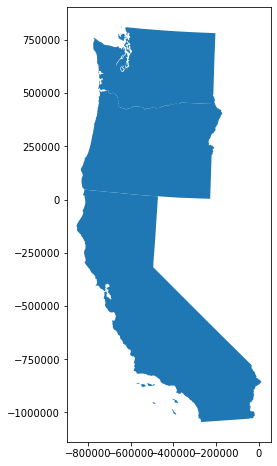

In [32]:
westcoast_gdf.plot();

## Combine the states as a single MultiPolygon geometry
* See the `unary_union` attribute 

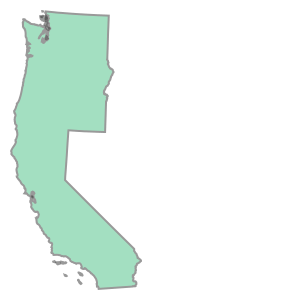

In [33]:
westcoast_geom = westcoast_gdf.unary_union
westcoast_geom

Note: If you have a column that classifies features in a GeoDataFrame (e.g., a column for `region` that contains `West Coast` and `East Coast`), you can also use `dissolve(by='region')` to create a new GeoDataFrame of merged polygons

## Now buffer the combined geometry
* Use a 50 km buffer

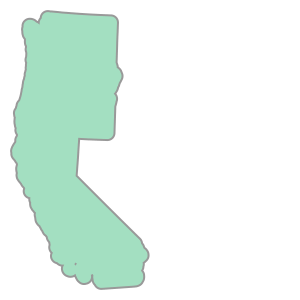

In [34]:
westcoast_geom_buff = westcoast_geom.buffer(50000)
westcoast_geom_buff

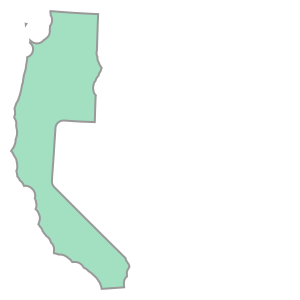

In [35]:
#Buffer distance can be negative
westcoast_geom_erode = westcoast_geom.buffer(-50000)
westcoast_geom_erode

## Use a `difference` operation to isolate the buffered region around the individual polygons
* This is sometimes useful if you need to extract statistics from another dataset

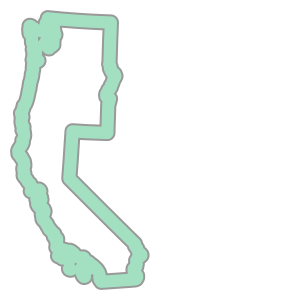

In [36]:
westcoast_geom_buff.difference(westcoast_geom_erode)

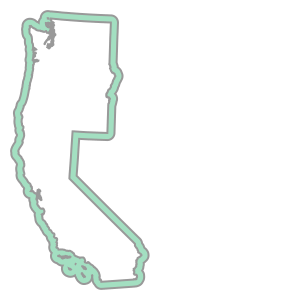

In [37]:
westcoast_geom_buff.difference(westcoast_geom)

### Somebody should put that on a t-shirt!

# Clip the GLAS points to Washington state polygon
* This should be pretty straightforward:
    * Identify records from the GLAS GeoDataFrame that `intersects` the WA state geometry
    * Extract those records and store in a new GeoDataFrame
* This may take 5-10 seconds to complete

## Compute some statistics for the WA state GLAS points
* How many points are in WA state?
* What is mean `glas_z` elevation in WA state?

## Plot the resulting points
* Add the WA polygon outline
    * Note that you don't need/want to use the Polygon Geometry object here.  Remember, you have a GeoDataFrame containing just the WA geometry.  And you know how to plot GeoDataFrames.
* Add the WA state centroid you calculated earlier using a distinct marker style (e.g., `'*'` or `'x'`)
    * Can use simple matplotlib `plot` with the coordinates, or can use `wa_gdf.centroid.plot()`

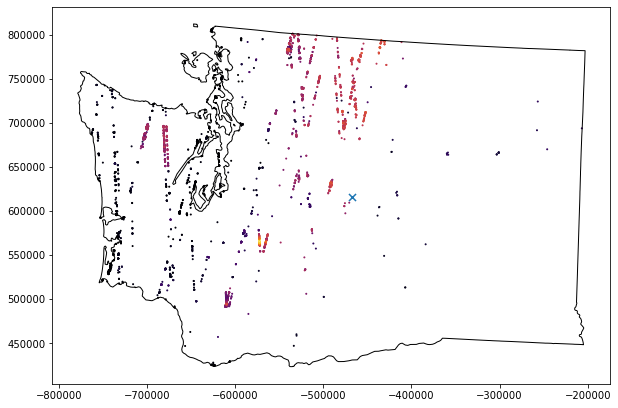

## Find the GLAS point closest to the WA state centroid
* See the GeoDataFrame `distance` function
* Create a plot showing this distance for each GLAS point.
* What is the total offset between this point and the centroid in km?
* Extra Credit: Do a quick calculation using the Pythagorean theorem to determine Euclidian distance between the centroid and this point - does this match the output of the `distance` function?

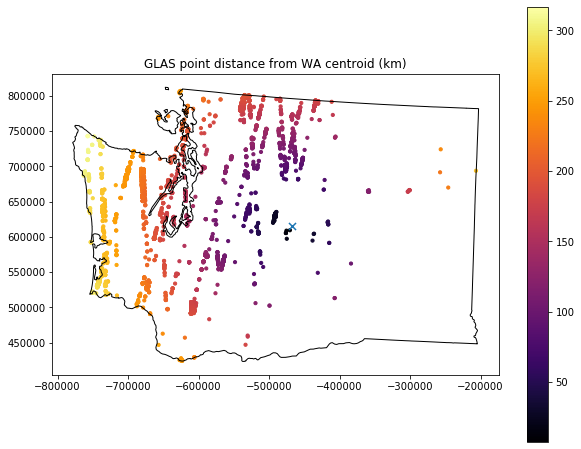

## What is the `glas_z` value of this point?

### Extra credit: Calculate the geodesic distance between these two points and compare with your Euclidian distance

## Which GLAS point is farthest from the WA state perimeter?
* Note that this is different than the above calcuations for point to point distance, you're looking for point to polyline distance
* What is the distance in km?
* This should be pretty straightforward, combining elements from the above questions/demo
* This can be useful to consider distance from the coast and climatology (temperature, precipitation and other environmental variables) 

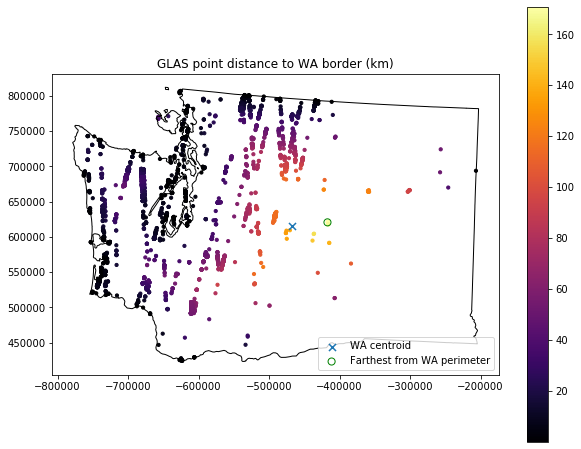

# Aggregate GLAS points for state polygons and compute `glas_z` statistics

OK, we computed some stats for GLAS points within WA state.  Now let's find the GLAS points that intersect **each** state polygon. 

Objectives:
1. Compute the count of points and mean `glas_z` elevation for each state
2. Generate cloropleth maps for both

One approach would be to loop through each state polygon, and do an intersection operation like we did for WA state above.  But this is inefficient, and doesn't scale well.  It is much more efficient to do a spatial join between the points and the polygons with the intersection operator, then groupby and aggregate to compute the relevant statistics for each state.

You may have learned how to perform a join or spatial join in a GIS class.  So, do we need to open ArcMap or QGIS here?  Do we need a full-fledged spatial database like PostGIS?  No!  GeoPandas has you covered.

## Start with a spatial join between the GLAS points and state polygons
* Start by reviewing the Spatial Join documentation here: http://geopandas.org/mergingdata.html
* Use the geopandas `sjoin` method: http://geopandas.org/reference/geopandas.sjoin.html

## Let's extract the columns that matter
* Since we only care about `glas_z` values here let's create some smaller GeoDataFrames:
    * Extract the `['glas_z', 'geometry']` columns from the GLAS GeoDataFrame
    * Extract the `['NAME', 'geometry']` columns from the states GeoDataFrame

In [54]:
glas_gdf_aea_lite = glas_gdf_aea[['glas_z', 'geometry']]
states_gdf_aea_lite = states_gdf_aea[['NAME','geometry']]

## Now try a spatial join between these two 
* Use the GLAS points as the "left" GeoDataFrame and the States as the "right" GeoDataFrame
* Start by using default options (`op='intersects', how='inner'`)
* Note the output geometry type and columns

,glas_z,geometry,index_right,NAME
0,1398.51,POINT (709799.202 277341.464),50,Wyoming
1,1387.11,POINT (709764.987 276472.876),50,Wyoming
2,1392.83,POINT (709758.108 276299.312),50,Wyoming
3,1384.24,POINT (709751.251 276125.525),50,Wyoming
4,1369.21,POINT (709744.472 275951.747),50,Wyoming
...,...,...,...,...
64091,1868.30,POINT (485383.310 -614213.155),31,New Mexico
64499,1701.32,POINT (532000.909 -627592.245),31,New Mexico
64500,1735.44,POINT (531888.662 -629143.573),31,New Mexico
8377,1362.41,POINT (88028.900 -555642.025),2,Arizona


## Now reverse the order of the two input GeoDataFrames
* Use default options again

,NAME,geometry,index_right,glas_z
2,Arizona,"POLYGON ((154168.778 -554620.014, 154529.150 -...",60425,1348.03
2,Arizona,"POLYGON ((154168.778 -554620.014, 154529.150 -...",8377,1362.41
4,California,"MULTIPOLYGON (((-715643.093 -425702.978, -7156...",50480,1175.06
4,California,"MULTIPOLYGON (((-715643.093 -425702.978, -7156...",20760,1175.35
4,California,"MULTIPOLYGON (((-715643.093 -425702.978, -7156...",25343,1177.33
...,...,...,...,...
50,Wyoming,"POLYGON ((353937.458 -103001.150, 347810.639 -...",50917,1482.92
50,Wyoming,"POLYGON ((353937.458 -103001.150, 347810.639 -...",63044,1567.04
50,Wyoming,"POLYGON ((353937.458 -103001.150, 347810.639 -...",27749,1531.53
50,Wyoming,"POLYGON ((353937.458 -103001.150, 347810.639 -...",55521,1488.82


## Which one makes more sense?
* Remember, we're trying to add a State name to each GLAS point
* You'll need to decide which one to use moving forward 

## Extra credit
Experiment with a few different operations (`op`) for the spatial join (e.g., `intersects`) and review the output with `head()`
* Descriptions of different operations are here: https://shapely.readthedocs.io/en/stable/manual.html#object.intersects
    * Note that for our input spatial join of points and polygons, some of the details are irrelevant
* Do you notice a difference in the output number of records?
* Choose the `how` keyword appropriately:
    * Test a few options and note the output number of records
    * Are there any points that don't fall within a state polygon?  Why might this be?  Do you want to preserve these moving forward?

## Sanity check
* Run a `head` on our new GeoDataFrame
* For each GLAS point, there should be a new column with the corresponding state NAME
* Check the original and joined `shape`
    * Does the number of records equal the original number of GLAS points?
    * Why might they be different?

In [59]:
glas_gdf_aea_states.head()

,glas_z,geometry,index_right,NAME
0,1398.51,POINT (709799.202 277341.464),50,Wyoming
1,1387.11,POINT (709764.987 276472.876),50,Wyoming
2,1392.83,POINT (709758.108 276299.312),50,Wyoming
3,1384.24,POINT (709751.251 276125.525),50,Wyoming
4,1369.21,POINT (709744.472 275951.747),50,Wyoming


The excluded points are all near the coasline and fall just outside of the state polygons we're using here.

## Now aggregate by state `NAME`
* Note: the GeoPandas doc example uses a `dissolve` operation here, which is a wrapper around the `groupby` and `agg` Pandas functions
    * https://geopandas.org/aggregation_with_dissolve.html
* But look at the geometry column for the points in your GeoDataFrame.  The `dissolve` is going to compute the union for the points in each state and return a `MultiPoint` Geometry for each state, which we don't really want/need.  It will also take longer to run.
* Instead, let's try a `groupby` operation for the `NAME` column, and then `agg` with a list of functions we care about: `['count', 'mean']` (statitiscs for point count and mean point elevation for each state)

glas_z              index_right     
            count         mean       count mean
NAME                                           
Arizona         2  1355.220000           2    2
California  13865  1701.699116       13865    4
Colorado     8429  3253.791521        8429    5
Idaho        7297  1790.290550        7297   12
Montana      2658  2125.944759        2658   26
Nevada      12081  1335.431521       12081   28
New Mexico    209  1835.156699         209   31
Oregon       2838  1500.335525        2838   37
Utah         5498  1439.914989        5498   44
Washington   5265  1224.196596        5265   47
Wyoming      5708  2106.420340        5708   50

## Sanity check
* That groupby and agg should be pretty fast (~1-2 seconds)
* Check the `type()` of the output
* Since `groupby` and `agg` are Pandas operation, you should now have a new Pandas `DataFrame` (not a GeoPandas `GeoDataFrame`) with index of state names and columns for `count` and `mean` values in each state

## Simplify the Heirarchical Index
* However, you may have noticed that you now have a "heirarchical index", with `count` and `mean` columns for both `glas_z` and `index_right`.
    * More info on this is here: https://pandas.pydata.org/pandas-docs/stable/user_guide/advanced.html.  
    * This can be confusing at first, but is actually a powerful feature of Pandas.
    * For our situation, we don't care about `index_right` (byproduct of our spatial join), so you can simplify by extracting only the `glas_z` values
        * Do this the way you would extract a column from a standard DataFrame: `my_agg_df['glas_z']` and store as a new DataFrame
        * You can now directly access the `count` and `mean` columns

## But how are we going to plot this?
* We have `count` and `mean` of GLAS points for each state!  Objective #1 complete!
* We now want to visualize these values, but we lost our state Polygon/MultiPolygon Geometry along the way
* No problem, we can combine our DataFrame with the original State GeoDataFrame
    * Can use `merge` to do an attribute join on the shared state `'NAME'` index for the two
        * Take a moment to review the `my_agg_df.merge?` options
        * In this case, we have a common `NAME` field, so we can use the `on='NAME'` here for attribute join
    * Careful about the order of the two inputs here (state GeoDataFrame and the DataFrame with your stats) - you want to preserve the index and geometry of the GeoDataFrame, adding the `count` and `mean` columns.
        * If you get it right, you should be able to `plot()` the GeoPandas GeoDataFrame and get a map.  If you got it backwards, the output of `plot()` will be a line plot for the regular Pandas DataFrame

,NAME,geometry,count,mean
0,Arizona,"POLYGON ((154168.778 -554620.014, 154529.150 -...",2,1355.220000
1,California,"MULTIPOLYGON (((-715643.093 -425702.978, -7156...",13865,1701.699116
2,Colorado,"POLYGON ((676663.784 -79851.653, 687472.665 -7...",8429,3253.791521
3,Idaho,"POLYGON ((262042.966 118606.627, 262050.807 11...",7297,1790.290550
4,Montana,"POLYGON ((724974.579 373318.016, 721985.964 37...",2658,2125.944759
5,Nevada,"POLYGON ((19110.594 -111409.267, 19091.252 -13...",12081,1335.431521
6,New Mexico,"POLYGON ((788515.764 -1069948.341, 778844.044 ...",209,1835.156699
7,Oregon,"POLYGON ((-594882.050 433066.202, -593746.435 ...",2838,1500.335525
8,Utah,"POLYGON ((269240.875 -78331.163, 270286.947 -1...",5498,1439.914989
9,Washington,"MULTIPOLYGON (((-613063.656 729252.630, -61333...",5265,1224.196596


## Create a cloropleth map to visualize the count of GLAS points in each state
* https://geopandas.readthedocs.io/en/latest/mapping.html#choropleth-maps

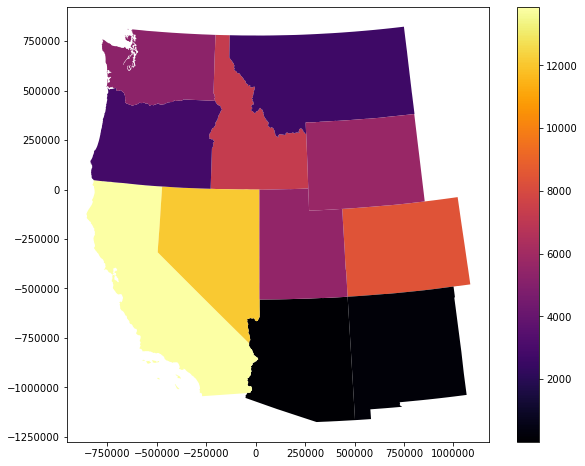

## Create a cloropleth map to visualize the mean elevation GLAS points in each state

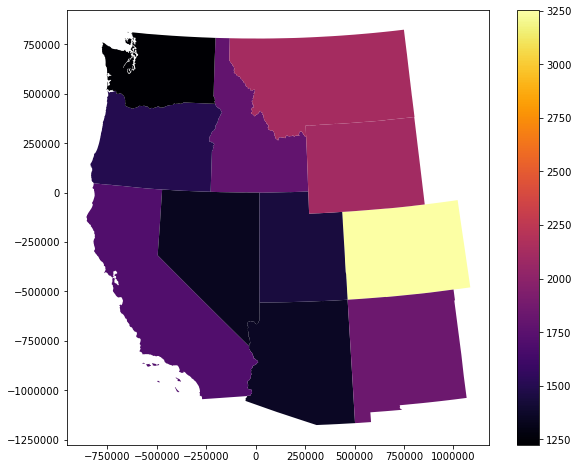

# Point Densitiy Visualization: Hexbin plots

OK, now we have statistics and plots for our existing polygons.  But what if we want to compute similar statistics for a regularly spaced grid of cells?  For our `count`, this will give us point density, allowing for better visualization of the spatial distribution.

We could define a set of adjacent rectangular polygons, and repeat our `sjoin`, `groupby`, `agg` sequence above.  Or we can use some existing matplotlib functionality, and create a hexbin plot!

Hexagonal cells are preferable over a standard square/rectangular grid for various reasons: https://pro.arcgis.com/en/pro-app/tool-reference/spatial-statistics/h-whyhexagons.htm

Here are some resources on generating hexbins using Python and matplotlib:
* https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hexbin.html
* http://darribas.org/gds15/content/labs/lab_09.html

*Note: an equal-area projection is always good idea for a hexbin plot.  Fortunately, we started with our AEA projection, so we're all set!*

## Create a hexbin that shows the number of points in each cell
* Play around with the `gridsize` option to set the number of bins in each dimension (or specify the dimensions of your bins)
* Use the `mincnt` option to avoid plotting cells with 0 count
* Overlay the state polygons to help visualize
* Set your plot `xlim` and `ylim` to the GLAS point bounds
* Can use linear color ramp with vmin and vmax options, or try a logarithmic color ramp, since we have a broad range of counts

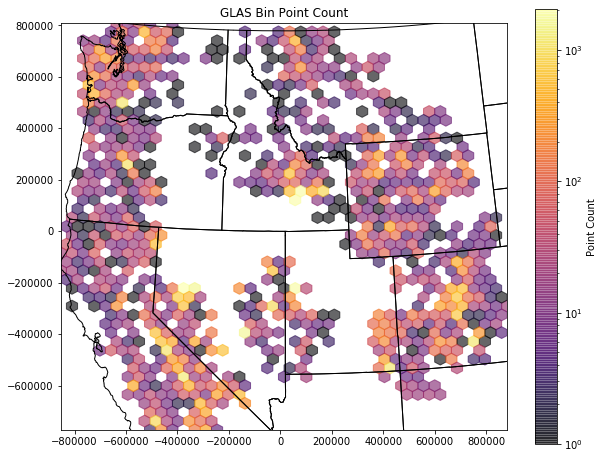

## Create a second hexbin plot that shows the median elevation in each cell
* See documentation for the `C` and `reduce_C_function` options

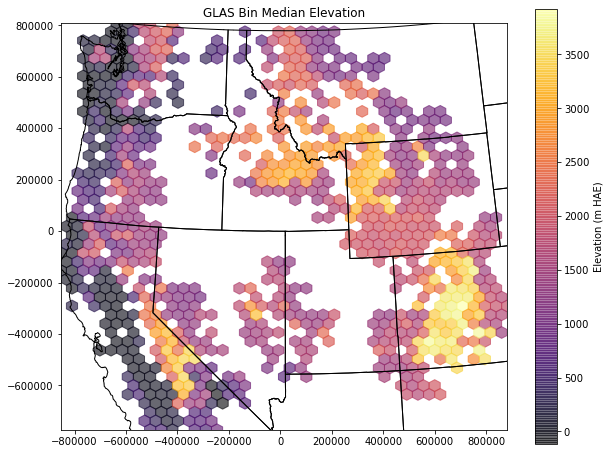

## Extra Credit: Generate a Kernel Density Estimator (KDE) plot using `seaborn`
* This is another nice approach to estimate the point density on a continuous grid
* https://seaborn.pydata.org/generated/seaborn.kdeplot.html#seaborn.kdeplot
* https://seaborn.pydata.org/tutorial/distributions.html

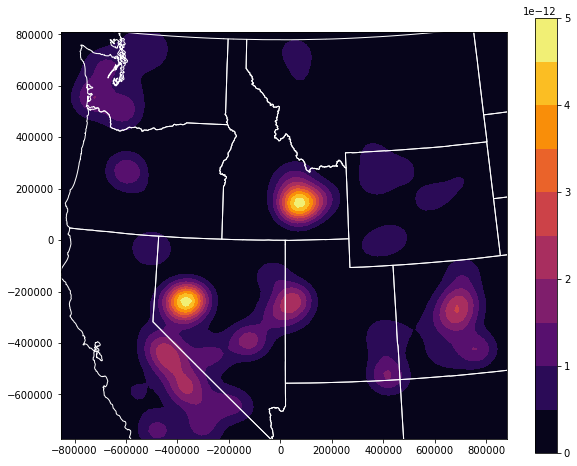

In [73]:
#import seaborn as sns

## Static plots with tiled basemaps using `contextily`
* Our state outlines provide some context for our plots, but what if we want a raster map background
* Can use the convenientt `contextily` package for this: https://github.com/geopandas/contextily

In [74]:
import contextily as ctx

### Using the default basemap projection
* Freely available tiled web maps are great: https://en.wikipedia.org/wiki/Tiled_web_map
* Most tiled basemaps use a standard "web mercator" projection (EPSG:3857)
* For this example, we will reproject our point GeoDataFrame to match the default tiles

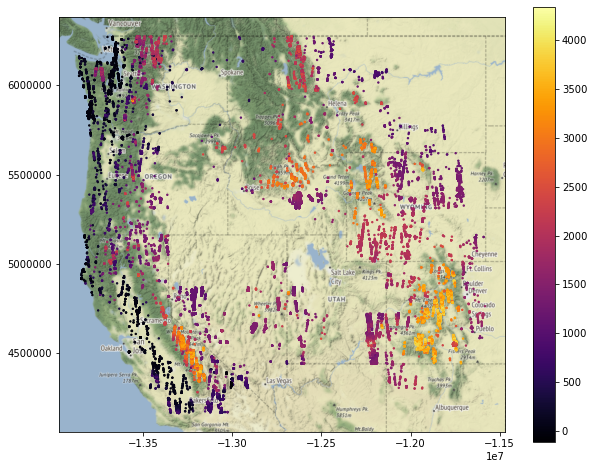

In [75]:
f, ax = plt.subplots()
#Convert points to web mercator projection and plot
glas_gdf_aea.to_crs('EPSG:3857').plot(ax=ax, column='glas_z', cmap='inferno', markersize=2, legend=True)
#Add basemap
ctx.add_basemap(ax=ax, url=ctx.sources.ST_TERRAIN)

### Using our custom projected coordinate system
* The contextily package also supports simple tile warping into arbitrary projections: https://contextily.readthedocs.io/en/latest/warping_guide.html
* We will revisit raster reprojection during the Raster 2 lab, but for now, enjoy the simplicity!

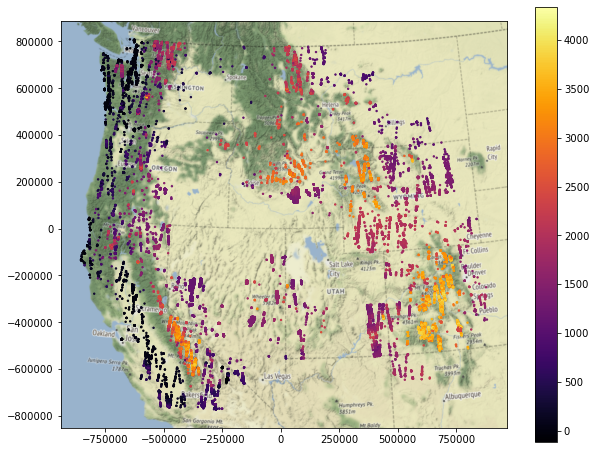

In [76]:
import contextily as ctx
f, ax = plt.subplots()
#Convert points to web mercator projection and plot
glas_gdf_aea.plot(ax=ax, column='glas_z', cmap='inferno', markersize=2, legend=True)
#Add basemap, specifying crs keyword
ctx.add_basemap(ax=ax, crs=glas_gdf_aea.crs, url=ctx.sources.ST_TERRAIN)

# Interactive plots
## folium
* We haven't discussed as a class yet, but this is a simple, effective interactive visualization package (alternative to matplotlib)
* See the example here: https://python-visualization.github.io/folium/quickstart.html
* For your plot:
    * Isolate points to WA state for now, convert to EPSG:4326
    * Compute the centroid of the WA state polygon (remember GeoPandas `unary_union`) in EPSG:4326
    * Create a map object centered on this centroid
        * Use the 'Stamen Terrain' basemap layer
        * Experiment with `zoom_start` level to find a good extent
    * Export your WSG84 GeoDataFrame using `to_json()`, then load all features using `folium.features.GeoJson`
    * Add the points to the map
* Take a moment to explore this interactive map interface.

In [77]:
#Compute WA state centroid in WGS84
#wa_center_wgs84 = list(wa_gdf.to_crs('EPSG:4326').centroid.iloc[0].coords)[0][::-1]
wgs_c = wa_gdf.to_crs('EPSG:4326').unary_union.centroid
wa_center_wgs84 = (wgs_c.y, wgs_c.x)
wa_center_wgs84

(47.38198786066976, -120.45228413717685)

In [78]:
#Reproject to WGS84
glas_gdf_wa = glas_gdf_aea_wa.to_crs('EPSG:4326')

In [79]:
import folium
m = folium.Map(location=wa_center_wgs84, zoom_start=7, tiles='Stamen Terrain')
folium.features.GeoJson(glas_gdf_wa.to_json()).add_to(m)
m

### OK, but performance isn't great with so many points
* Use a `MarkerCluster` object here to cluster nearby points at each zoom level
* This example is likely useful: https://ocefpaf.github.io/python4oceanographers/blog/2015/12/14/geopandas_folium/

In [80]:
from folium.plugins import MarkerCluster
m = folium.Map(location=wa_center_wgs84, tiles='Stamen Terrain', zoom_start=7)
#Create clustered map with popups
locations, popups = [], []
for idx,row in glas_gdf_wa.iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])
    popups.append(idx)
t = folium.FeatureGroup(name='GLAS')
t.add_child(MarkerCluster(locations=locations, popups=popups))
m.add_child(t)
m

## ipyleaflet

ipyleaflet is similar to folium.

Note that leaflet uses tiled basemaps: https://en.wikipedia.org/wiki/Tiled_web_map 

Default projection is Web Mercator (EPSG:3857): https://en.wikipedia.org/wiki/Web_Mercator_projection.  This works well for lower latitudes, but not the polar regions.  I know QGIS and contextily can reproject tiled basemaps on the fly - I haven't tested with ipyleaflet.

In [81]:
import ipyleaflet

In [82]:
#So many basemap options
ipyleaflet.basemaps.keys()

dict_keys(['OpenStreetMap', 'OpenTopoMap', 'OpenMapSurfer', 'Hydda', 'Esri', 'HikeBike', 'MtbMap', 'CartoDB', 'NASAGIBS', 'Strava', 'Stamen'])

In [83]:
#Aaaand, I ran out of time...

## Extra Credit (or, other challenging yet interesting problems)

### Create a function to identify the 3 closest points to each GLAS point 
* Then use these 3 points to:
    - Define a plane
    - Calculate the elevation on that planar surface at the original GLAS point coordinates
    - Compute the difference between the observed GLAS elevation and the interpolated elevation 

### For each GLAS point, compute mean and std for all points within a 10 km radius
* Can potentially create buffer around the point, then intersect with all points
* Can compute distance to all points, then threshold

### Load the Randolph Glacier Inventory polygons and do a spatial join with ICESat points (https://www.glims.org/RGI/).